In [3]:
# install Numpy version 1.22.0
pip install numpy==1.22.0

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 16.8 MB 4.7 MB/s eta 0:00:01    |▏                               | 92 kB 5.1 MB/s eta 0:00:04
  Attempting uninstall: numpy
    Found existing installation: numpy 1.20.0
    Uninstalling numpy-1.20.0:
      Successfully uninstalled numpy-1.20.0
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
Note: you may need to restart the kernel to use updated packages.


# 1

In [6]:
# Importing the necessary modules and Library
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import datetime
from datetime import datetime, date
from detection_helpers import *
from tracking_helpers import *
from bridge_wrapper import *
from PIL import Image
import warnings
warnings.filterwarnings('ignore')


detector = Detector() # it'll detect ONLY [person, horses,sports ball]. class = None means detect all classes. List info at: "data/coco.yaml"
detector.load_model('./best.pt',) # pass the path to the trained weight file

# Initialise  class that binds detector and tracker in one class
tracker = YOLOv7_DeepSORT(reID_model_path="./deep_sort/model_weights/mars-small128.pb", detector=detector)
# output = None will not save the output video
tracker.track_video("WCG _ Lanes 03 - 04 NW Wide Angle (P1C6).mp4", output="counting0304.mp4", show_live = False, skip_frames = 0, count_objects = True, verbose=1)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

Processed frame no: 1 || Current FPS: 2.68 || Objects tracked: 1 ||  0 vehicles
Processed frame no: 2 || Current FPS: 47.32 || Objects tracked: 1 ||  0 vehicles
Processed frame no: 3 || Current FPS: 51.06 || Objects tracked: 1 ||  0 vehicles
Processed frame no: 4 || Current FPS: 44.69 || Objects tracked: 1 ||  0 vehicles
Processed frame no: 5 || Current FPS: 51.98 || Objects tracked: 1 ||  0 vehicles
Processed frame no: 6 || Current FPS: 54.15 || Objects tracked: 1 ||  0 vehicles
Processed frame no: 7 || Current FPS: 45.57 || Objects tracked: 1 ||  0 vehicles
Processed frame no: 8 || Current FPS: 51.41 || Objects tracked: 1 ||  0 vehicles
Processed frame no: 9 || Current FPS: 56.9 || Objects tracked: 1 ||  0 vehicles
Processed frame no: 10 || Current FPS: 52.18 || Objects tracked: 1 ||  0 vehicles
Processed 

# Counting CV

In [18]:
 

class Point:
    def __init__(self, x, y):
        self.x = x
        self.y = y

def ccw(A, B, C):
    return (C.y - A.y) * (B.x - A.x) > (B.y - A.y) * (C.x - A.x)

def intersect(A, B, C, D):
    return ccw(A, C, D) != ccw(B, C, D) and ccw(A, B, C) != ccw(A, B, D)

def check_cross(checkline, traj_line):
    previous_x, previous_y = traj_line[1].x, traj_line[1].y
    next_x, next_y = traj_line[0].x, traj_line[0].y
    return intersect(Point(previous_x, previous_y), Point(next_x, next_y),
                     Point(checkline[0][0], checkline[0][1]), Point(checkline[1][0], checkline[1][1]))



In [19]:
# Read the CSV file into a DataFrame
csv_file_path = '/scratch/user/isaiasnegassi/Research/yolov7-deepsort-tracking/bbox_coordinates.csv'
df = pd.read_csv(csv_file_path)
#changing frames to seconds 
df['Timestamp'] = pd.to_datetime((df['Frame']/15).astype(int), unit='s').dt.time

# Convert 'Timestamp' to datetime and set as index
desired_date = date(2023, 11, 11)  # Set your desired date here
df['Timestamp'] = df['Timestamp'].apply(lambda t: datetime.combine(desired_date, t))
df.set_index('Timestamp', inplace=True)
df.head()

,Frame,Track ID,Class,X_min,Y_min,X_max,Y_max,X_mid,Y_mid
Timestamp,,,,,,,,,
2023-11-11,1,1,car,602,34,76,64,640,66
2023-11-11,2,1,car,604,32,74,66,640,65
2023-11-11,3,1,car,603,32,75,65,640,64
2023-11-11,4,1,car,603,32,74,64,640,64
2023-11-11,5,1,car,604,33,74,64,640,64


In [20]:
# Organize data by Track ID
track_data = {}
crossed_track_ids = set()

for _,entry in df.iterrows():
    track_id = entry['Track ID']
    if track_id not in track_data:
        track_data[track_id] = []
    track_data[track_id].append(entry)

# Access previous and next frames for each Track ID
for track_id, entries in track_data.items():
    if track_id in crossed_track_ids:
        continue  # Skip processing if the Track ID has already crossed the line

    for i, entry in enumerate(entries):
        current_frame = entry['Frame']
        current_midpoint = Point(entry['X_mid'], entry['Y_mid'])
        counting_line = [(450, 25), (690, 78)]  # Adjust as needed
        if i > 0:
            previous_frame = entries[i - 1]['Frame']
            previous_midpoint = Point(entries[i - 1]['X_mid'], entries[i - 1]['Y_mid'])
            traj_line = [previous_midpoint, current_midpoint]

            if check_cross(counting_line, traj_line):
                crossed_track_ids.add(track_id)

        if i < len(entries) - 1:
            next_frame = entries[i + 1]['Frame']
            next_midpoint = Point(entries[i + 1]['X_mid'], entries[i + 1]['Y_mid'])
            traj_line = [current_midpoint, next_midpoint]
            if check_cross(counting_line, traj_line):
                crossed_track_ids.add(track_id)

# Count the number of crossings in 5-minute intervals
crossings_count = df.groupby(pd.Grouper(freq='5T')).apply(lambda x: len(set(x['Track ID']).intersection(crossed_track_ids)))

print(f"Total vehicles crossed the line every 5 minutes: {crossings_count}")

Total vehicles crossed the line every 5 minutes: Timestamp
2023-11-11 00:00:00     6
2023-11-11 00:05:00     0
2023-11-11 00:10:00     3
2023-11-11 00:15:00     1
2023-11-11 00:20:00     2
2023-11-11 00:25:00     2
2023-11-11 00:30:00     4
2023-11-11 00:35:00     4
2023-11-11 00:40:00     2
2023-11-11 00:45:00     6
2023-11-11 00:50:00    10
2023-11-11 00:55:00    13
2023-11-11 01:00:00    11
2023-11-11 01:05:00     6
2023-11-11 01:10:00    12
2023-11-11 01:15:00     7
2023-11-11 01:20:00    23
2023-11-11 01:25:00    23
2023-11-11 01:30:00    26
2023-11-11 01:35:00    34
2023-11-11 01:40:00    29
2023-11-11 01:45:00    26
2023-11-11 01:50:00    28
2023-11-11 01:55:00    29
2023-11-11 02:00:00    34
2023-11-11 02:05:00    28
2023-11-11 02:10:00    26
2023-11-11 02:15:00    34
2023-11-11 02:20:00    24
2023-11-11 02:25:00    15
2023-11-11 02:30:00    12
2023-11-11 02:35:00     5
2023-11-11 02:40:00    10
2023-11-11 02:45:00     4
2023-11-11 02:50:00     4
2023-11-11 02:55:00     6
2023-

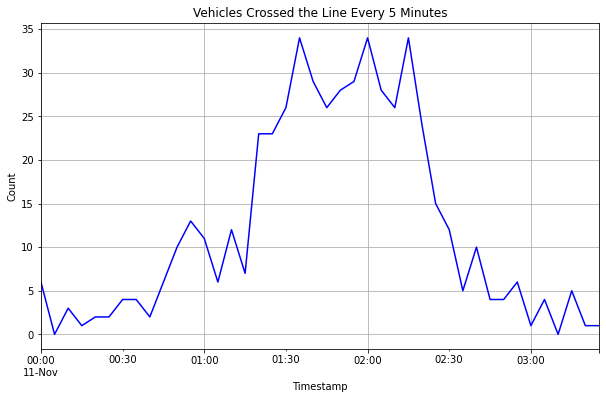

In [21]:
# ploting Vehicle crosssed every 5 minutes
plt.figure(figsize=(10, 6))
crossings_count.plot(marker='', linestyle='-', color='b')
plt.title('Vehicles Crossed the Line Every 5 Minutes')
plt.xlabel('Timestamp')
plt.ylabel('Count')
plt.grid(True)
plt.show()
# Convert the result to a DataFrame
df_cv_car = pd.DataFrame({'Timestamp': crossings_count.index, 'Crossings_Count': crossings_count.values})


# Reading Ground Truth

The total GT count is  552


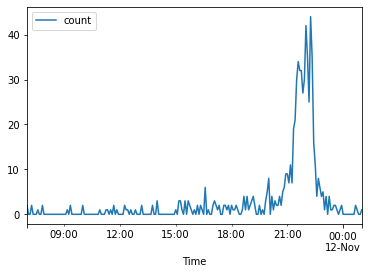

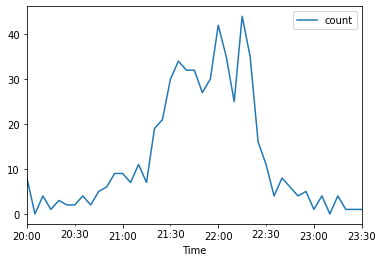

In [24]:


df =pd.read_csv('/scratch/user/isaiasnegassi/Research/yolov7-deepsort-tracking/2023 Football Counts.xlsx - 11-11 Miss State.csv')
wcg=df[df['Facility'] == 'WCG']
wcg['Lane'].unique()

lanes_to_select0304 = ['WCG 03 NW Rev Exit','WCG 04 NW Exit'] # 2
lane0304 = wcg[wcg['Lane'].isin(lanes_to_select0304)]
%matplotlib inline

time_seconds=[]

for date_string in lane0304['Incident Date']:

    datetime_object = pd.to_datetime(date_string, format='%m/%d/%y %H:%M')
    
    time_seconds.append(datetime_object)
    
# lane0304['Time'] = time_seconds
# lane0304['count'] = 1
lane0304.loc[:, 'Time'] = time_seconds
lane0304.loc[:, 'count'] = 1


# plot
lane0304.groupby(pd.Grouper(key='Time', freq='5T')).agg({
    # 'A': 'sum',
    # 'B': 'sum',
    # 'C': 'sum',
    # 'D': 'sum',
    'count': 'sum'}).plot()

start_time = '2023-11-11 20:00:00'  # 3
end_time = '2023-11-11 23:30:00'
df=lane0304
# Use boolean indexing to select rows within the specified time period
selected_data = df[(df['Time'] >= start_time) & (df['Time'] <= end_time)]
selected_data
# plot
agg_df=selected_data.groupby(pd.Grouper(key='Time', freq='5T')).agg({
    # 'A': 'sum',
    # 'B': 'sum',
    # 'C': 'sum',
    # 'D': 'sum',
    'count': 'sum'
})
agg_df.plot()

print('The total GT count is ', selected_data['count'].sum())



# Comparision

The total CV count is  521


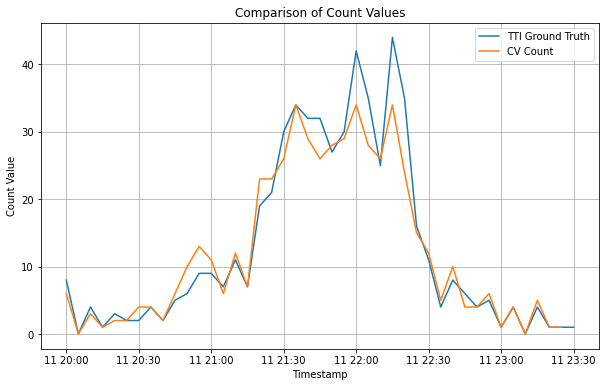

In [17]:
print('The total CV count is ', df_cv_car['Crossings_Count'].sum())

df_cv_car['Timestamp'] = pd.to_datetime(df_cv_car['Timestamp'])
df_cv_car['Timestamp'] = df_cv_car['Timestamp'].apply(lambda x: x.replace(year=2023, month=11, day=11, hour=x.hour + 20))

#df_cv_car['Timestamp'] = df_cv_car['Timestamp'] + datetime.timedelta(minutes=0) # change this for minutes


# Assuming 'Timestamp' is the common column in both dataframes
plt.figure(figsize=(10, 6))

# Plot agg_df
plt.plot(agg_df.index, agg_df['count'], label='TTI Ground Truth')

# Plot Comparison of Count Values
plt.plot(df_cv_car['Timestamp'], df_cv_car['Crossings_Count'], label='CV Count')

plt.title('Comparison of Count Values')
plt.xlabel('Timestamp')
plt.ylabel('Count Value')
plt.legend()
plt.grid(True)
plt.show()

In [13]:
# Merge
merged_df = pd.merge(agg_df, df_cv_car, left_on='Time', right_on='Timestamp')

# Rename columns as per your requirement
merged_df = merged_df.rename(columns={'Timestamp': 'Time','count': 'GT_Count', 'Crossings_Count': 'CV_Count'})

merged_df

,GT_Count,Time,CV_Count
0,8,2023-11-11 20:00:00,6
1,0,2023-11-11 20:05:00,0
2,4,2023-11-11 20:10:00,3
3,1,2023-11-11 20:15:00,1
4,3,2023-11-11 20:20:00,2
5,2,2023-11-11 20:25:00,2
6,2,2023-11-11 20:30:00,4
7,4,2023-11-11 20:35:00,4
8,2,2023-11-11 20:40:00,2
9,5,2023-11-11 20:45:00,6


In [10]:
#Saving Outputs
output_csv_filename = "/scratch/user/isaiasnegassi/Research/Isaias/count_0304.csv"
merged_df.to_csv(output_csv_filename)